In [2]:
%matplotlib inline
import matplotlib
import numpy as np
from plantcv import plantcv as pcv
matplotlib.rcParams['figure.figsize'] = (12,12)

In [3]:
# Set variables
pcv.params.debug = "plot"

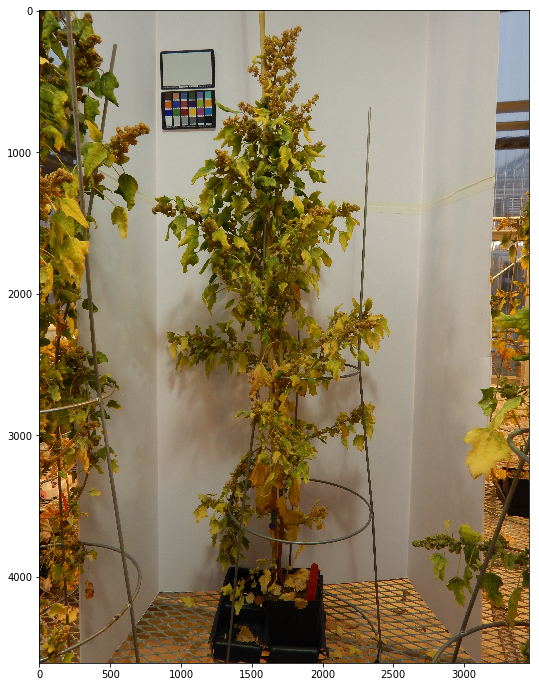

In [4]:
#Read img
img, img_path, plant_img = pcv.readimage("/home/jtovar/hot-quinoa/round5/whole_plant_images/heated_shoots_plant_45_day_45_after_heat_ended_20181031.jpg") 

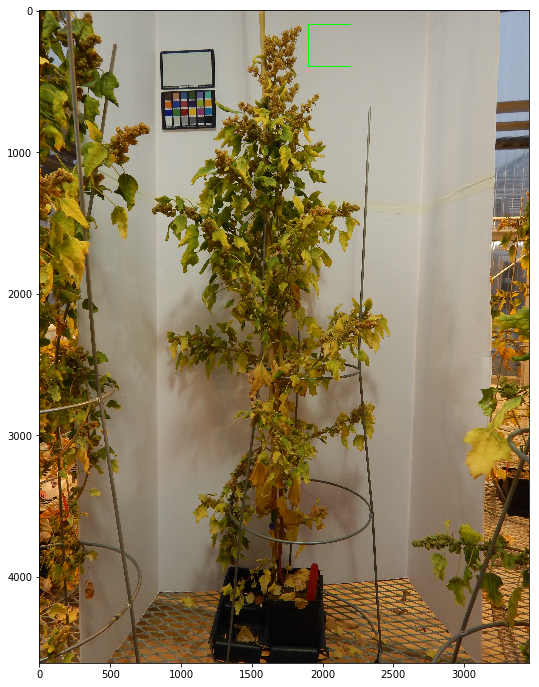

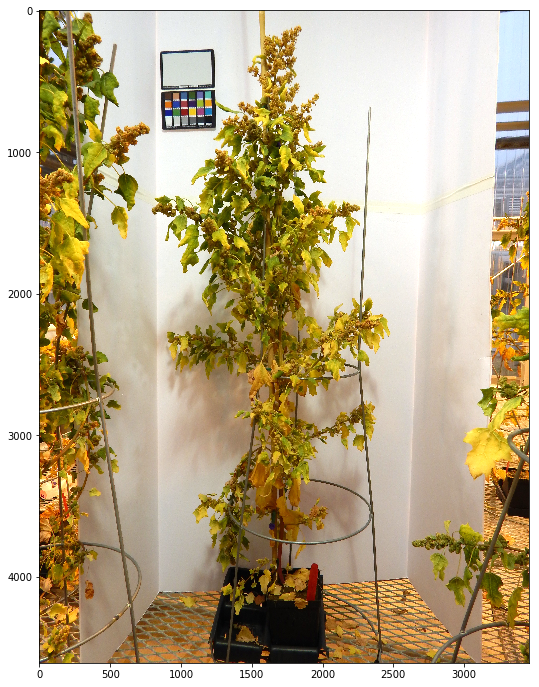

In [5]:
#White balance the image
wb_img = pcv.white_balance(img, mode='hist', roi=(1900, 100, 300, 300))

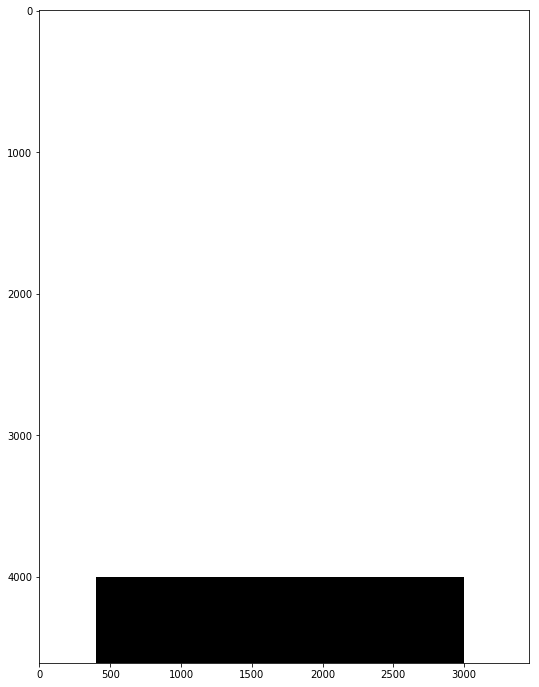

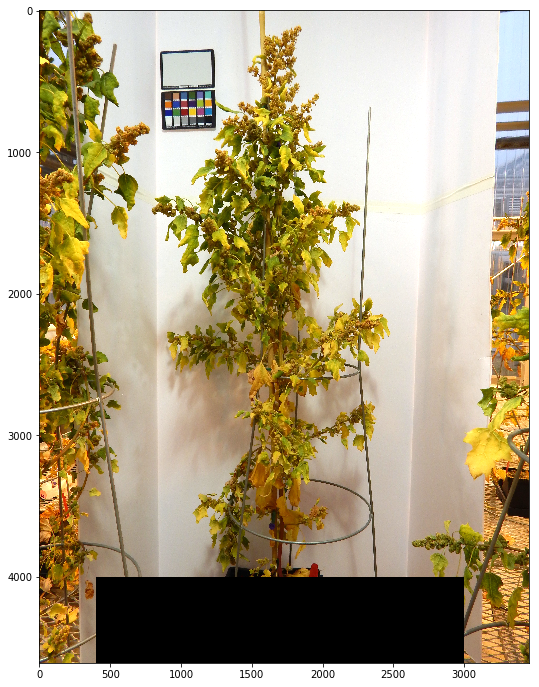

In [7]:
#Place a black box to cover the soil and the yellowish floor
masked, binary, contours, hierarchy = pcv.rectangle_mask(wb_img, (400,4000), (3000,4700), color="black")

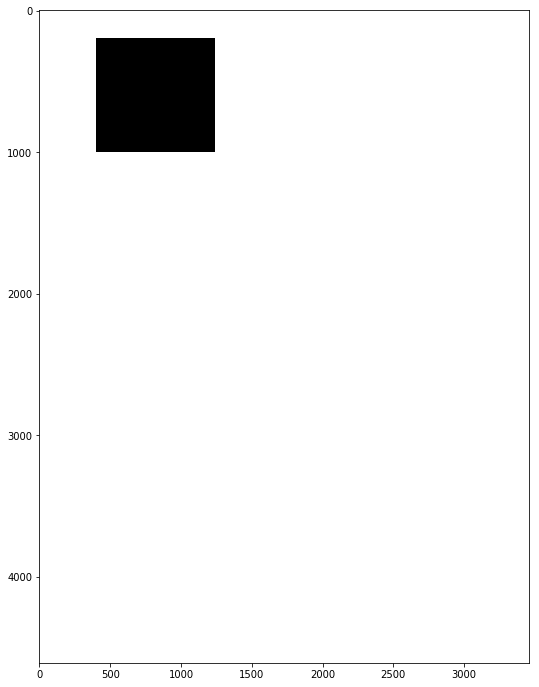

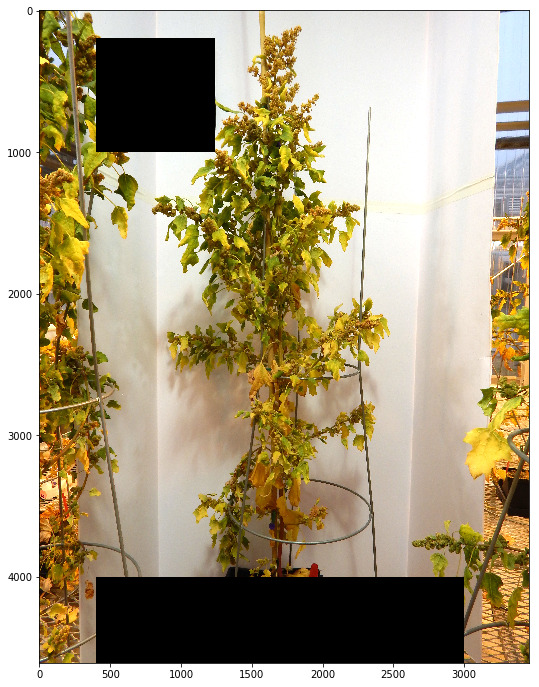

In [8]:
#Place a black box to cover the color card
masked1, binary, contours, hierarchy = pcv.rectangle_mask(masked, (400,200), (1240,1000), color="black")

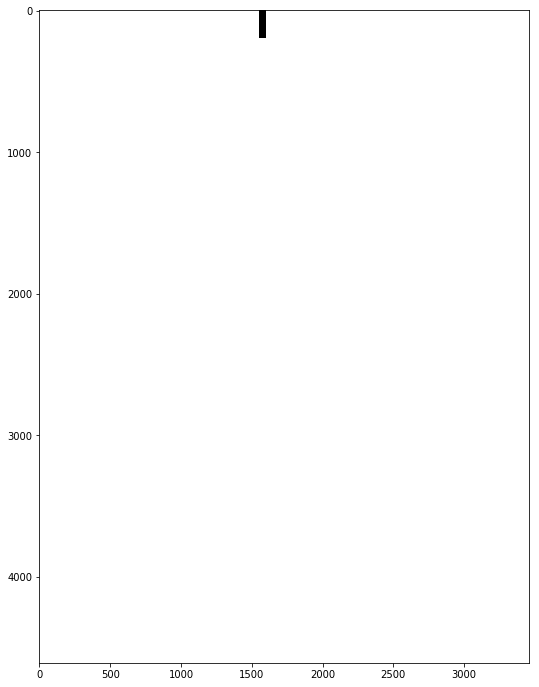

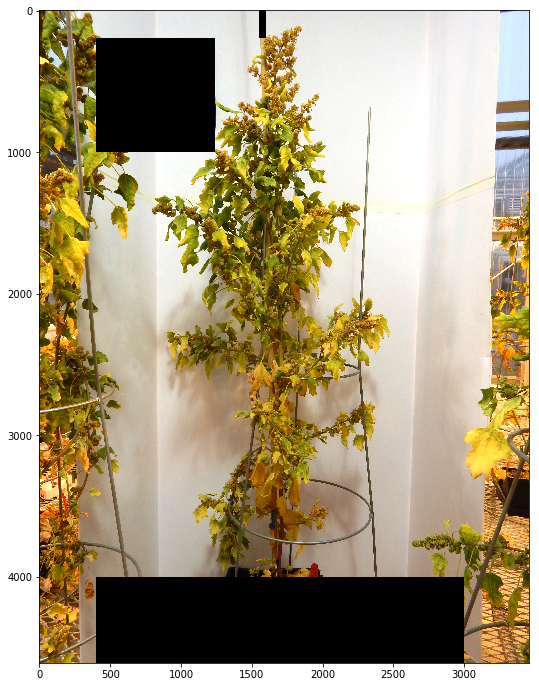

In [9]:
#Place a black box to cover the part of the stake that is above the plant
masked2, binary, contours, hierarchy = pcv.rectangle_mask(masked1, (1550,0), (1600,200), color="black")

In [ ]:
#Place a black box to cover any other part of the image that cannot be eliminated through thresholding
masked3, binary, contours, hierarchy = pcv.rectangle_mask(masked2, (1000,3000), (1650,4600), color="black")

In [ ]:
#Place a black box to cover any other part of the image that cannot be eliminated through thresholding
masked4, binary, contours, hierarchy = pcv.rectangle_mask(masked3, (2360,2500), (3000,3500), color="black")

In [ ]:
#Place a black box to cover any other part of the image that cannot be eliminated through thresholding
masked5, binary, contours, hierarchy = pcv.rectangle_mask(masked4, (1100,3300), (1350,4600), color="black")

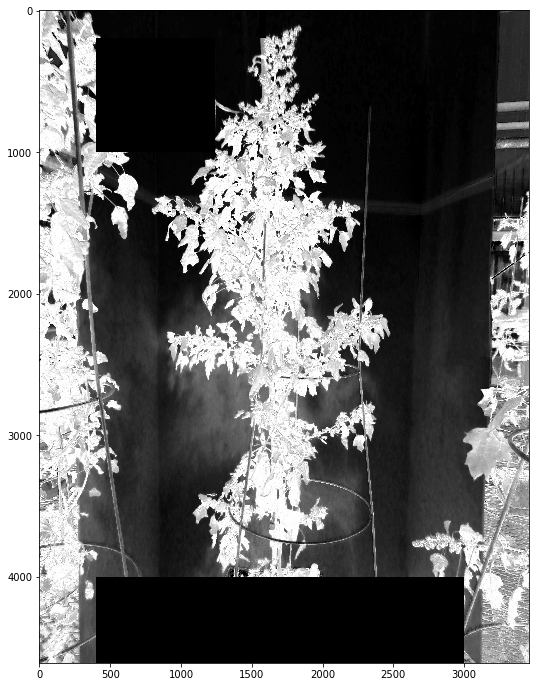

In [10]:
# Convert image fromat from RGB to HSV and extract the Saturation (s) channel
b = pcv.rgb2gray_hsv(masked2, 's')

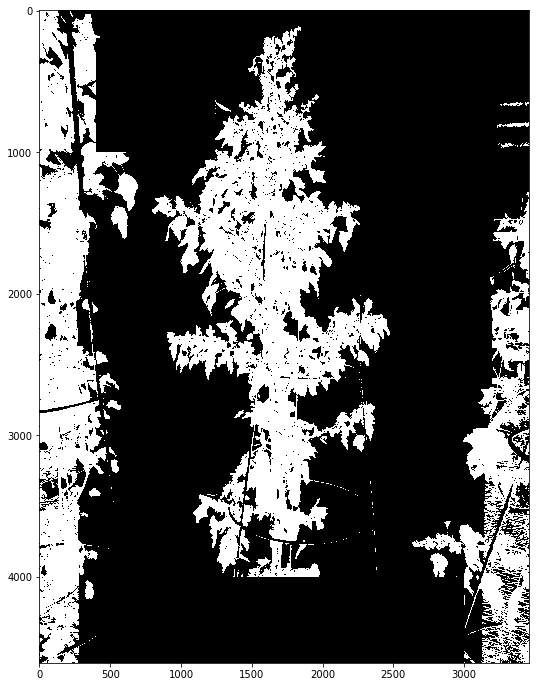

In [11]:
#Use a threshold to get rid of background
b_thresh = pcv.threshold.binary(b, 160, 255, 'light')

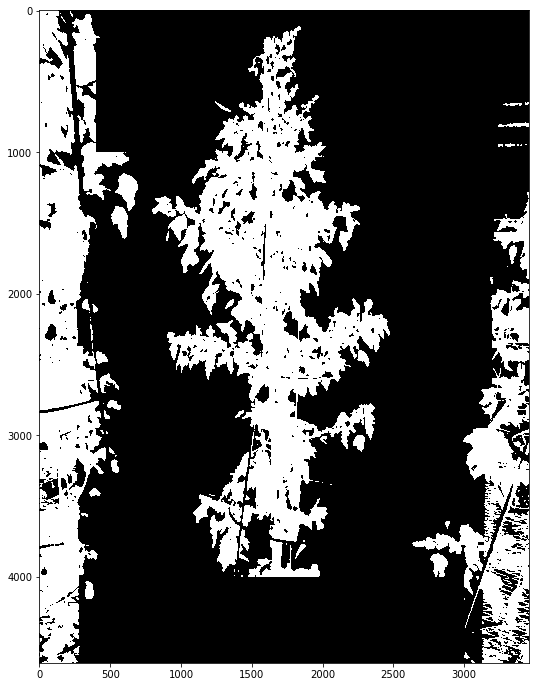

In [12]:
#Fill holes in
blur = pcv.median_blur(b_thresh, 10)

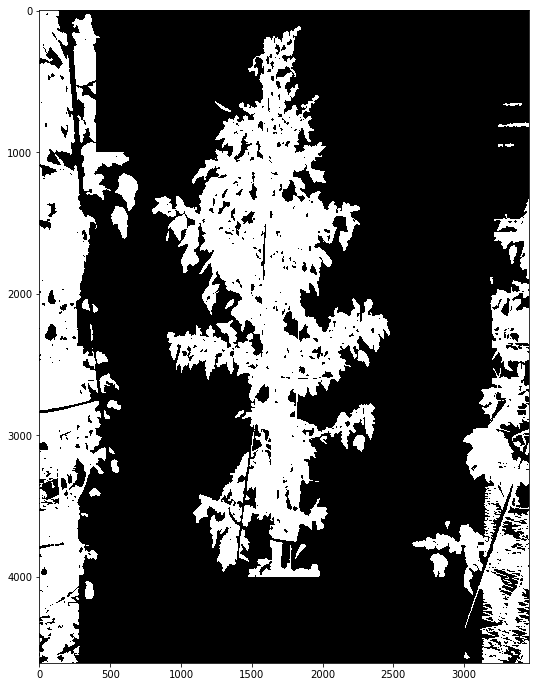

In [13]:
#More hole filling
fill_image = pcv.fill(blur, 500)

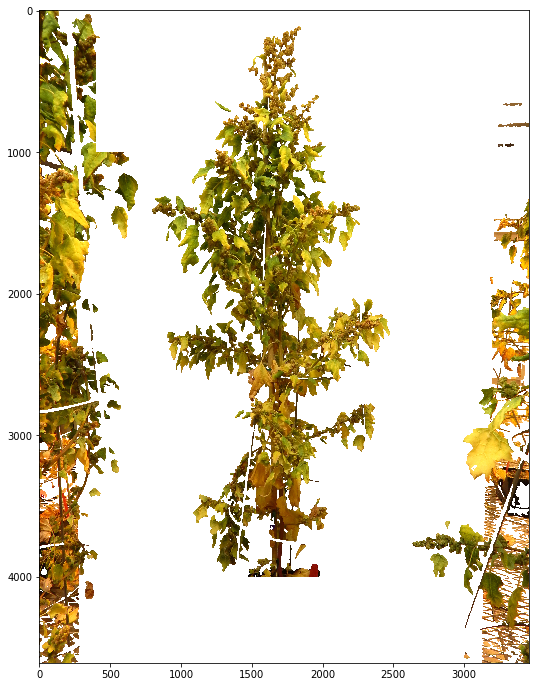

In [14]:
#Create a mask of the plant from the white balanced image
masked99 = pcv.apply_mask(wb_img, fill_image, 'white')

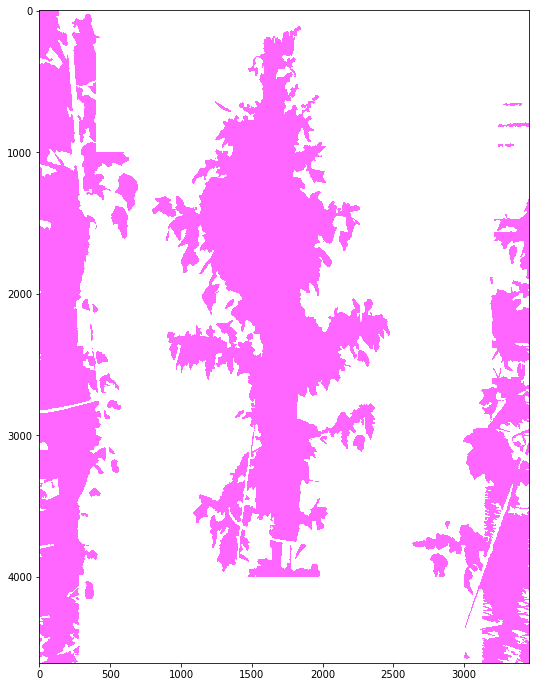

In [15]:
# Identify objects in the mask
id_objects, obj_hierarchy = pcv.find_objects(masked99, fill_image)

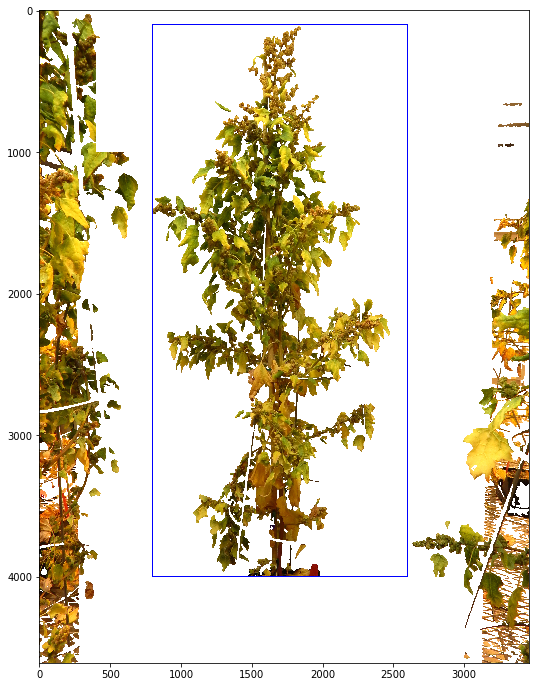

In [16]:
# Define region of interest, where the plant is
roi1, roi_hierarchy= pcv.roi.rectangle(x=800, y=100, h=3900, w=1800, img=masked99)

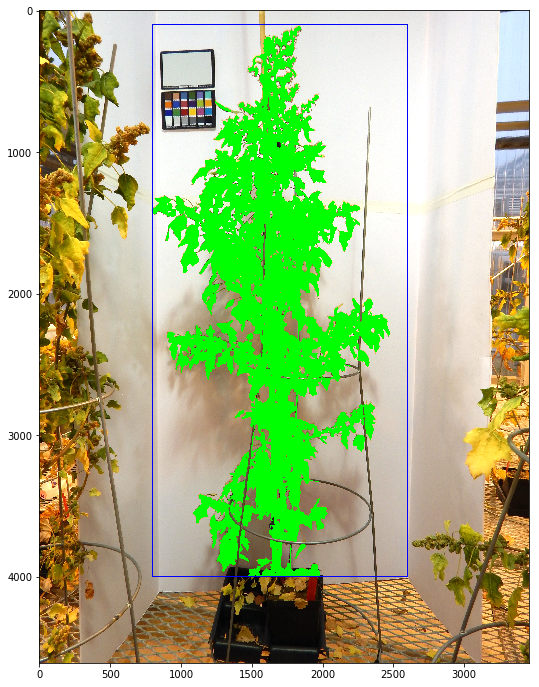

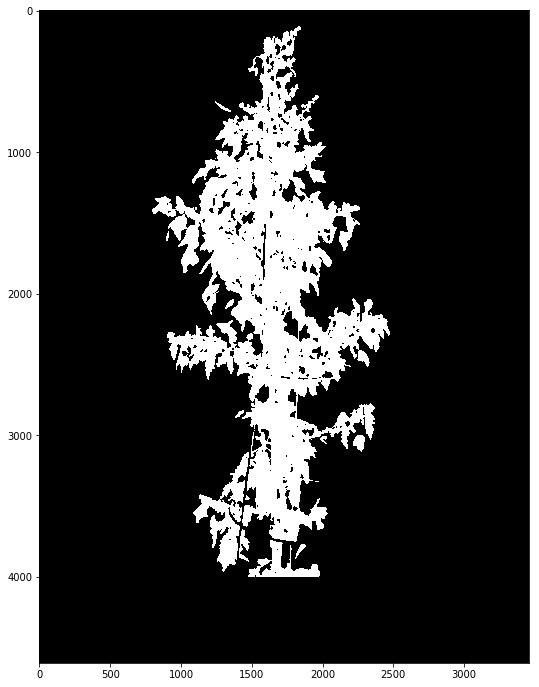

In [17]:
# Keep only objects that overlap with region of interest
roi_objects, hierarchy3, kept_mask, obj_area = pcv.roi_objects(wb_img, 'partial', roi1, roi_hierarchy, id_objects, obj_hierarchy)

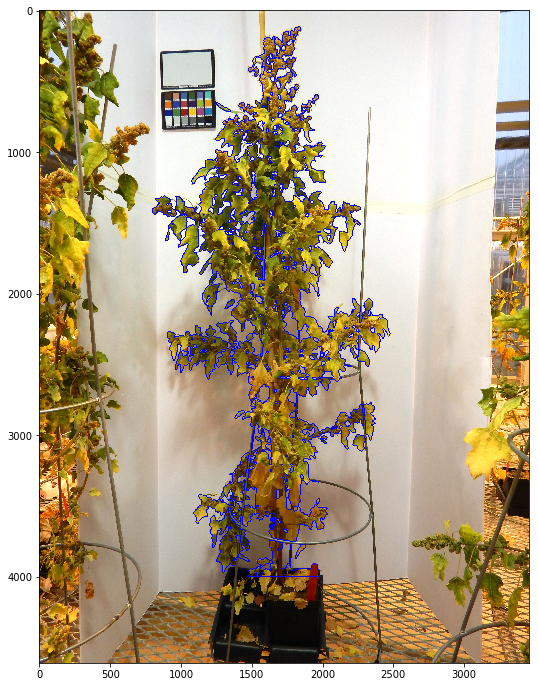

In [18]:
# Combine kept objects into a single object
obj, mask = pcv.object_composition(wb_img, roi_objects, hierarchy3)

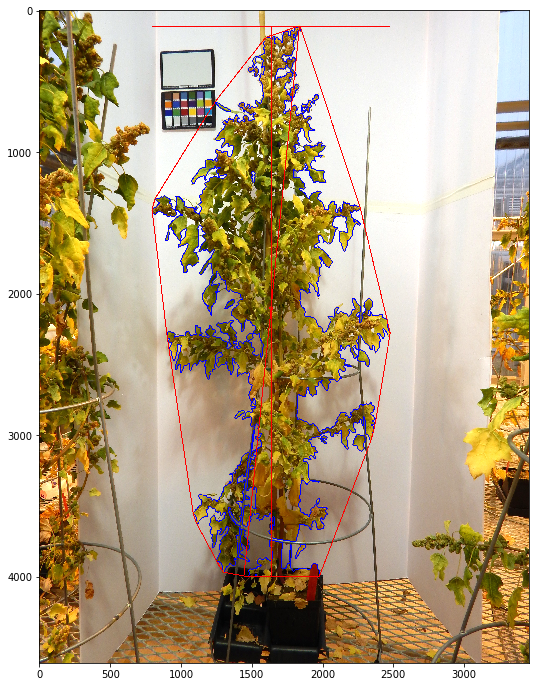

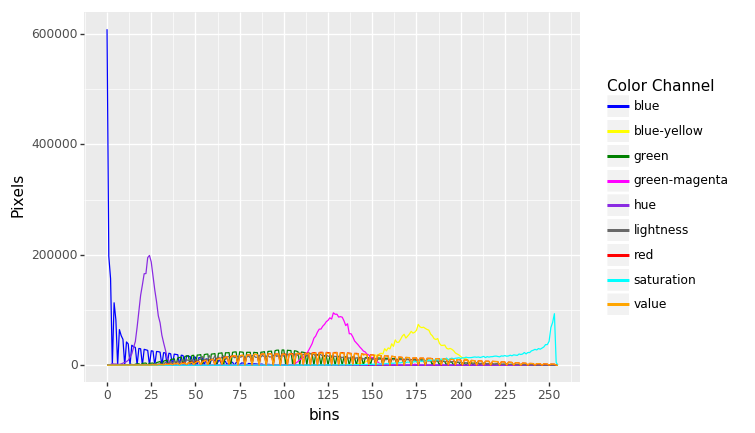

<ggplot: (-9223363262673309959)>


In [19]:
# Find shape properties
shape_header, shape_data, shape_img = pcv.analyze_object(wb_img,obj,mask)

# Analyze color
color_header, color_data, analysis_images = pcv.analyze_color(wb_img, mask, 256, 'all')

# Save all results in a text file
pcv.print_results(filename='/home/jtovar/hot-quinoa/round5/whole_plant_shapes/heated_shoots_plant_45_day_45_after_heat_ended_20181031.txt')

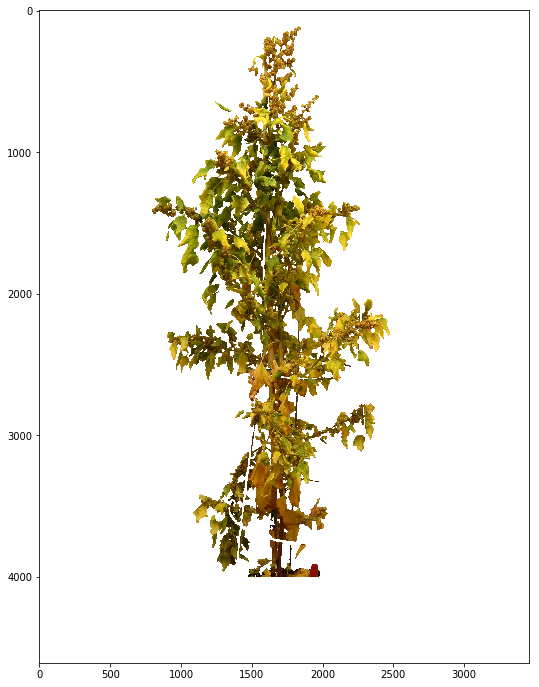

In [20]:
#Make a mask with just the plant, and print it for Naive Bayes green vs. yellow-ness quantification (maturity)
masked100 = pcv.apply_mask(wb_img, kept_mask, 'white')
pcv.print_image(masked100, "/home/jtovar/hot-quinoa/round5/whole_plant_images/masked_images/heated_shoots_plant_45_day_45_after_heat_ended_20181031_mask.png")
#Select green, yellow, and background pixels (manual step) on ImageJ, following Naive Bayes Multiclass tutorial at https://plantcv.readthedocs.io/en/latest/machine_learning_tutorial/

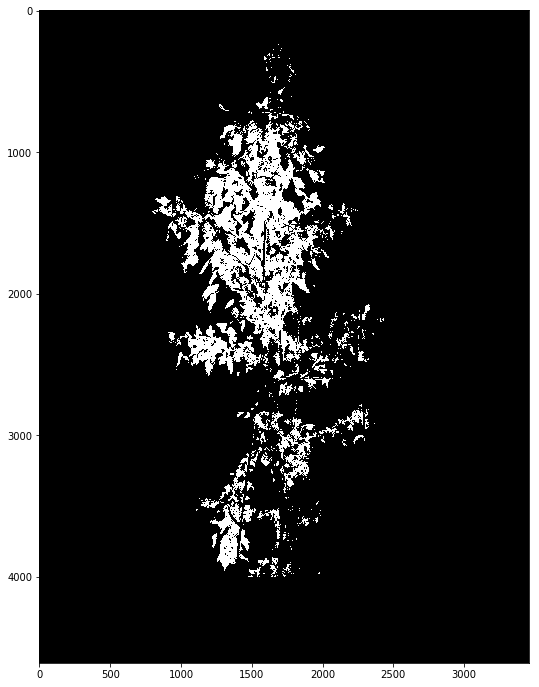

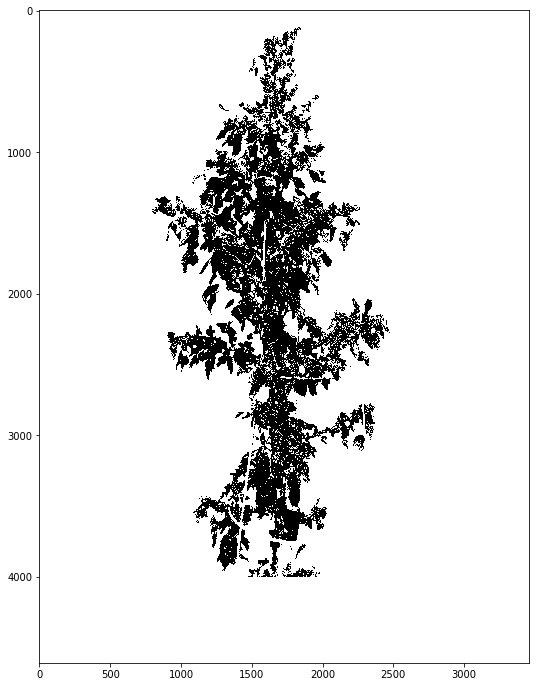

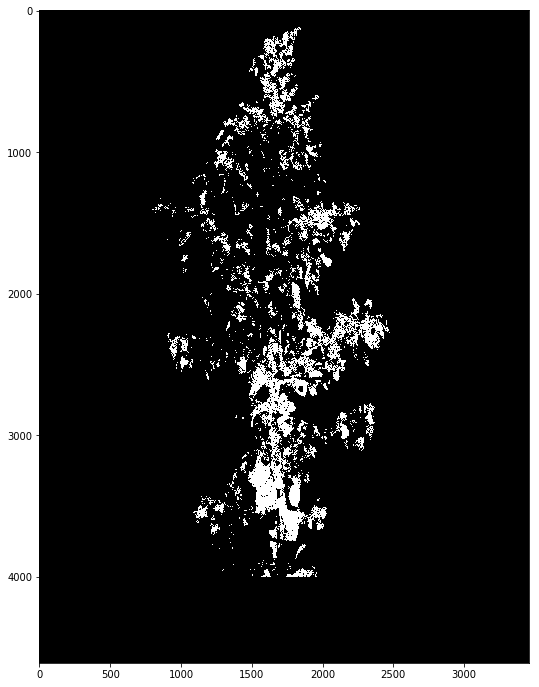

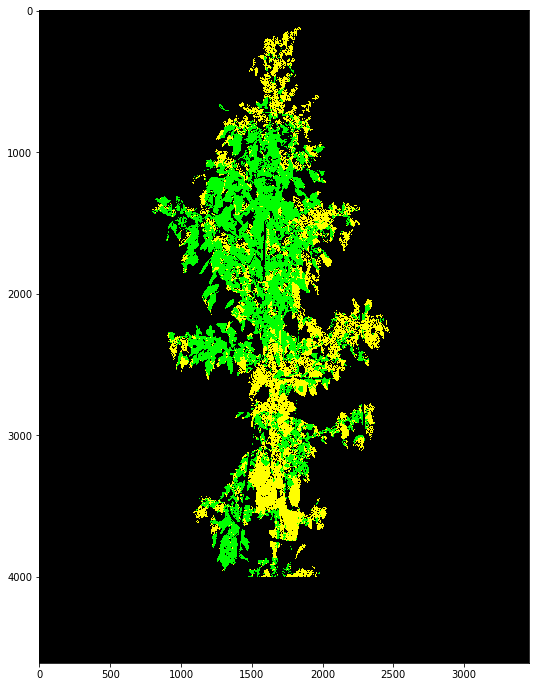

In [27]:
# Classify pixels as green or yellow to assess maturity of the plant 
masks = pcv.naive_bayes_classifier(rgb_img=masked100, pdf_file='/home/jtovar/hot-quinoa/round5/whole_plant_images/whole_plant_pdfs.txt')
colored_img = pcv.visualize.colorize_masks(masks=[masks['green'], masks['yellow']], colors=['green', 'yellow'])

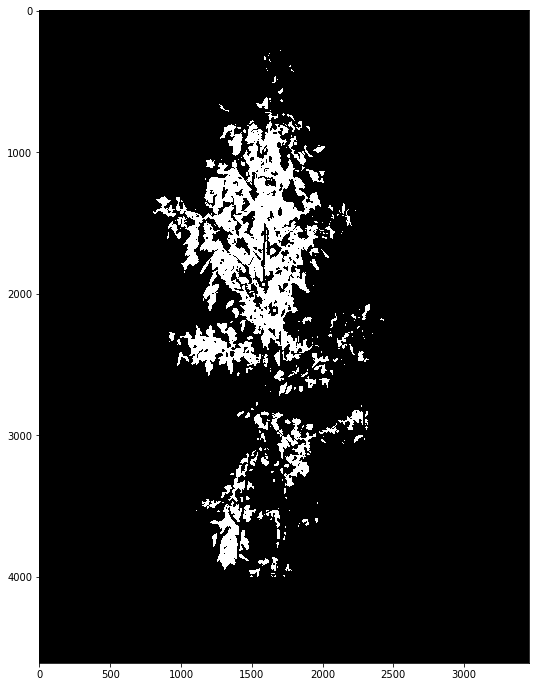

In [22]:
#Fill holes in green mask
blur_green = pcv.median_blur(masks['green'], 10)

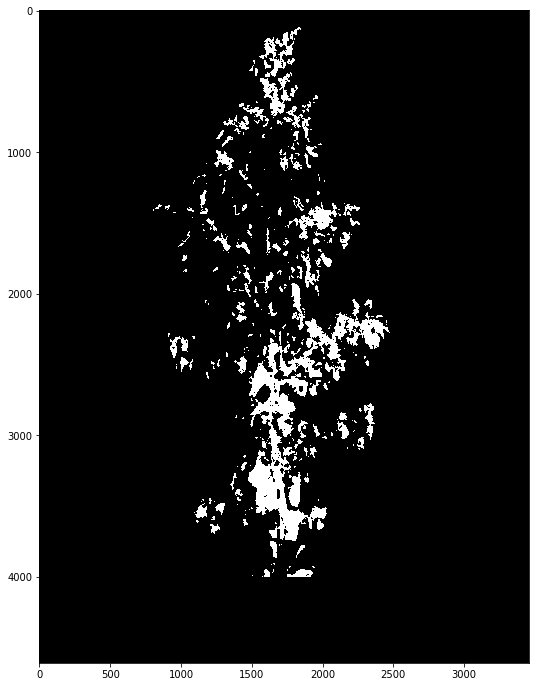

In [23]:
#Fill holes in yellow mask
blur_yellow = pcv.median_blur(masks['yellow'], 10)

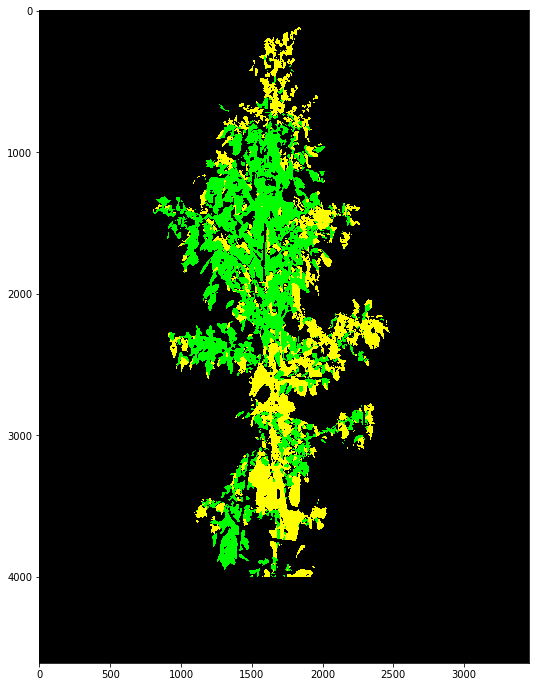

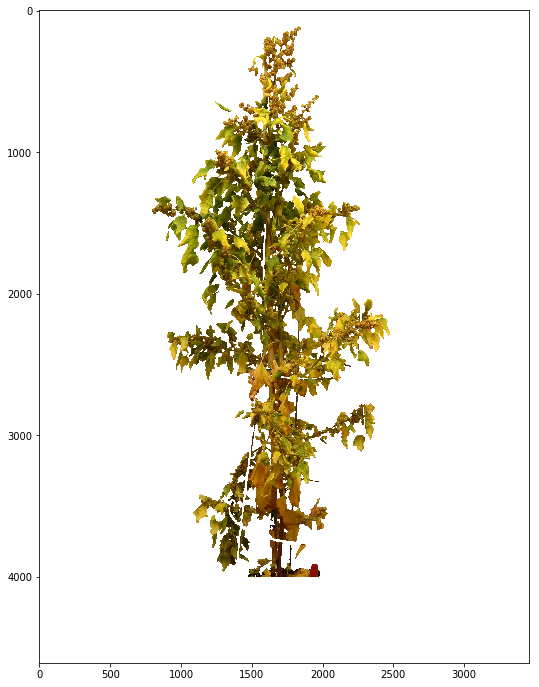

In [24]:
#Plot the green and yellow masks, and compare to plant
green_yellow_img = pcv.visualize.colorize_masks(masks=[blur_green, blur_yellow], colors=['green', 'yellow'])
pcv.plot_image(masked100)

In [25]:
#Obtain green area
np.count_nonzero(blur_green)

1056368

In [26]:
#Obtain yellow area
np.count_nonzero(blur_yellow)

748455